In [1]:
import sys
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline
from shapely.geometry import Point
import geopandas as gpd
import re

blight_violation = pd.read_csv('_97bd1c1e5df9537bb13398c9898deed7_detroit-blight-violations.csv', index_col='TicketID', infer_datetime_format=True, parse_dates=['TicketIssuedDT'])
blight_violation.head()


/home/alex/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3049: DtypeWarning: Columns (6,10,11,12) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,TicketNumber,AgencyName,ViolName,ViolationStreetNumber,ViolationStreetName,MailingStreetNumber,MailingStreetName,MailingCity,MailingState,MailingZipCode,...,AdminFee,LateFee,StateFee,CleanUpCost,JudgmentAmt,PaymentStatus,Void,ViolationCategory,ViolationAddress,MailingAddress
TicketID,,,,,,,,,,,,,,,,,,,,,
26288,05000001DAH,Department of Public Works,"Group, LLC, Grand Holding",2566,GRAND BLVD,743,"Beaubien, Ste. 201",Detroit,MI,48226,...,$20.00,$150.00,$10.00,$0.00,$1680.00,PAID IN FULL,0.0,0,"2566 GRAND BLVD\nDetroit, MI\n(42.363182370000...","743 Beaubien\nDetroit, MI 48226\n(42.333730630..."
19800,05000025DAH,Department of Public Works,"JACKSON, RAECHELLE",19014,ASHTON,20501,HEYDEN,DETROIT,MI,48219,...,$20.00,$10.00,$10.00,$0.00,$140.00,NO PAYMENT APPLIED,0.0,0,"19014 ASHTON\nDetroit, MI\n(42.429390762000025...","20501 HEYDEN\nDETROIT, MI 48219\n(42.442177633..."
19804,05000026DAH,Department of Public Works,"TALTON, CAROL ANN",18735,STAHELIN,18735,STAHELI N,DETROIT,MI,48219,...,$20.00,$10.00,$10.00,$0.00,$140.00,PAID IN FULL,0.0,0,"18735 STAHELIN\nDetroit, MI\n(42.4287074590000...","18735 STAHELI N\nDETROIT, MI 48219\n(42.428707..."
20208,05000027DAH,Department of Public Works,"BONNER, DARRYL E.",20125,MONICA,25335,PEEKSKILL,SOUTHFIELD,MI,48043,...,$20.00,$10.00,$10.00,$0.00,$140.00,NO PAYMENT APPLIED,0.0,0,"20125 MONICA\nDetroit, MI\n(42.44169828400004,...","25335 PEEKSKILL\nSOUTHFIELD, MI 48043\n(42.475..."
20211,05000028DAH,Department of Public Works,"GREGORY, JAMES LEE",17397,PRAIRIE,17397,PRAIRIE,DETROIT,MI,48221,...,$20.00,$10.00,$10.00,$0.00,$140.00,PAID IN FULL,0.0,0,"17397 PRAIRIE\nDetroit, MI\n(42.42031769500005...","17397 PRAIRIE\nDETROIT, MI 48221\n(42.42031769..."


In [2]:
blight_violation['ViolationCategory'].unique()

array([0, 1])

In [3]:
# URL of the dataset: https://data.detroitmi.gov/Property-Parcels/Parcel-Map/fxkw-udwf
detroit_parcels_file = 'geo_export_298e035b-710a-45a8-9a61-1634018e07b6.shp'
parcels = gpd.read_file(detroit_parcels_file)
parcels.head(3)

,address,bldg_style,councildis,depth,flr_area,frontage,hmstd_pre,imp_value,land_value,landmap,...,sqft,tax_status,taxpayer,total_acre,txbl_val,ward,yr_built,zip_code,zoning,geometry
0,421 E CONGRESS,None,5,138.0,0.0,30.0,0.0,0.0,423409.0,356,...,4131.0,TAXABLE,"CONGRESS REI, LLC.",0.095,214400.0,01,0.0,48226,B6,POLYGON ((-83.04186410314239 42.33242643461565...
1,405 GRATIOT,None,5,0.0,0.0,0.0,0.0,0.0,1415755.0,357,...,16462.0,TAXABLE,MHT FAMILY PROPERTIES IV LLC,0.378,718700.0,01,0.0,48226,B4,POLYGON ((-83.04499168856273 42.33651153786033...
2,2527 JOHN R 25,None,6,0.0,0.0,0.0,0.0,0.0,22000.0,358,...,0.0,TAXABLE,"AZUH, OGCOCHKWU",0.000,11000.0,01,0.0,None,PD,POLYGON ((-83.05142580720801 42.34216118996503...


In [4]:
parcels.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 381403 entries, 0 to 381402
Data columns (total 36 columns):
address       381321 non-null object
bldg_style    218466 non-null object
councildis    381402 non-null object
depth         381321 non-null float64
flr_area      381321 non-null float64
frontage      381321 non-null float64
hmstd_pre     381321 non-null float64
imp_value     381321 non-null float64
land_value    381321 non-null float64
landmap       381241 non-null object
nez           10702 non-null object
num_bldgs     381321 non-null float64
own_city      379619 non-null object
own_countr    2840 non-null object
own_state     379599 non-null object
own_street    381287 non-null object
own_zip       381291 non-null object
owner1        381318 non-null object
owner2        12101 non-null object
parcelnum     381399 non-null object
prop_class    381321 non-null object
related       12919 non-null object
sale_date     280512 non-null object
sale_price    381321 non-nul

In [66]:
crs = parcels.crs #{'init': 'epsg:4326'}
crs

{'init': 'epsg:4326'}

In [6]:
blight_violation['TicketIssuedDT'] = pd.to_datetime(blight_violation['TicketIssuedDT'], errors='coerce')

coordina = blight_violation['ViolationAddress'].str.extract(r'\(([-+]{0,1}\d+\.\d+), ([-+]{0,1}\d+\.\d+)\)').astype('float', errors='ignore')
coordina['coo'] = coordina.apply(lambda x: Point(x[1], x[0]), axis=1)
blight_violation_geo = gpd.GeoDataFrame(blight_violation, crs=crs, geometry = coordina.coo)

blight_violation_geo.head()

,TicketNumber,AgencyName,ViolName,ViolationStreetNumber,ViolationStreetName,MailingStreetNumber,MailingStreetName,MailingCity,MailingState,MailingZipCode,...,LateFee,StateFee,CleanUpCost,JudgmentAmt,PaymentStatus,Void,ViolationCategory,ViolationAddress,MailingAddress,geometry
TicketID,,,,,,,,,,,,,,,,,,,,,
26288,05000001DAH,Department of Public Works,"Group, LLC, Grand Holding",2566,GRAND BLVD,743,"Beaubien, Ste. 201",Detroit,MI,48226,...,$150.00,$10.00,$0.00,$1680.00,PAID IN FULL,0.0,0,"2566 GRAND BLVD\nDetroit, MI\n(42.363182370000...","743 Beaubien\nDetroit, MI 48226\n(42.333730630...",POINT (-83.09167672099994 42.36318237000006)
19800,05000025DAH,Department of Public Works,"JACKSON, RAECHELLE",19014,ASHTON,20501,HEYDEN,DETROIT,MI,48219,...,$10.00,$10.00,$0.00,$140.00,NO PAYMENT APPLIED,0.0,0,"19014 ASHTON\nDetroit, MI\n(42.429390762000025...","20501 HEYDEN\nDETROIT, MI 48219\n(42.442177633...",POINT (-83.22039357799997 42.42939076200003)
19804,05000026DAH,Department of Public Works,"TALTON, CAROL ANN",18735,STAHELIN,18735,STAHELI N,DETROIT,MI,48219,...,$10.00,$10.00,$0.00,$140.00,PAID IN FULL,0.0,0,"18735 STAHELIN\nDetroit, MI\n(42.4287074590000...","18735 STAHELI N\nDETROIT, MI 48219\n(42.428707...",POINT (-83.22754809599996 42.42870745900007)
20208,05000027DAH,Department of Public Works,"BONNER, DARRYL E.",20125,MONICA,25335,PEEKSKILL,SOUTHFIELD,MI,48043,...,$10.00,$10.00,$0.00,$140.00,NO PAYMENT APPLIED,0.0,0,"20125 MONICA\nDetroit, MI\n(42.44169828400004,...","25335 PEEKSKILL\nSOUTHFIELD, MI 48043\n(42.475...",POINT (-83.14501821599998 42.44169828400004)
20211,05000028DAH,Department of Public Works,"GREGORY, JAMES LEE",17397,PRAIRIE,17397,PRAIRIE,DETROIT,MI,48221,...,$10.00,$10.00,$0.00,$140.00,PAID IN FULL,0.0,0,"17397 PRAIRIE\nDetroit, MI\n(42.42031769500005...","17397 PRAIRIE\nDETROIT, MI 48221\n(42.42031769...",POINT (-83.14532817999998 42.42031769500005)


In [7]:
detroit_311 = pd.read_csv('_dcebfb2135a2bf5a6392493bd61aba22_detroit-311.csv', index_col='ticket_id', infer_datetime_format=True, parse_dates=['ticket_closed_date_time', 'ticket_created_date_time'])
detroit_311.head()

,city,issue_type,ticket_status,issue_description,rating,ticket_closed_date_time,acknowledged_at,ticket_created_date_time,ticket_last_updated_date_time,address,lat,lng,location,image
ticket_id,,,,,,,,,,,,,,
1516722,City of Detroit,Clogged Drain,Acknowledged,"Two drains one on each side of street, street ...",3,NaT,03/06/2015 10:03:38 PM,2015-03-06 21:57:52,04/12/2015 01:01:10 AM,"13120-13130 Ilene Street Detroit, MI 48238, USA",42.383998,-83.161039,"(42.3839977668, -83.1610385642)",NaN
1525361,City of Detroit,Clogged Drain,Acknowledged,standing water on lumplin,2,NaT,03/11/2015 04:23:11 PM,2015-03-11 16:14:29,04/07/2015 02:04:44 PM,"1485 E. Outer Drive Detroit, Michigan",42.440471,-83.080919,"(42.4404708, -83.080919)",NaN
1525218,City of Detroit,Clogged Drain,Closed,CITZEN CALLED TO REPORT CLOGGED DRAINS,2,2015-08-15 00:03:43,03/11/2015 03:39:05 PM,2015-03-11 15:26:20,08/15/2015 12:03:44 AM,"15460 Eastburn Detroit, Michigan",42.445244,-82.962038,"(42.445244, -82.962038)",NaN
1525214,City of Detroit,Clogged Drain,Acknowledged,Citizen called DWSD to report clogged drain,3,NaT,03/11/2015 03:35:02 PM,2015-03-11 15:22:42,06/07/2015 10:07:48 PM,"17541 Mendota St Detroit, Michigan",42.421043,-83.166194,"(42.421043, -83.166194)",NaN
1525142,City of Detroit,Clogged Drain,Acknowledged,@ THE CORNER OF GRIGGS & MARGARETA,2,NaT,03/11/2015 03:04:59 PM,2015-03-11 14:53:23,03/11/2015 03:04:59 PM,"Griggs Detroit, Michigan",42.402033,-83.162874,"(42.4020334, -83.1628741)",NaN


In [8]:
#detroit_311.info()
detroit_311['coord'] = detroit_311.apply(lambda x: Point(x.lng, x.lat), axis=1)
detroit_311_geo = gpd.GeoDataFrame(detroit_311, crs=crs, geometry = detroit_311.coord)
detroit_311_geo['geometry'].head()

ticket_id
1516722    POINT (-83.16103856417159 42.3839977668242)
1525361          POINT (-83.08091899999999 42.4404708)
1525218           POINT (-82.96203800000001 42.445244)
1525214           POINT (-83.16619399999999 42.421043)
1525142                 POINT (-83.1628741 42.4020334)
Name: geometry, dtype: object

In [9]:
detroit_crime = pd.read_csv('_dcebfb2135a2bf5a6392493bd61aba22_detroit-crime.csv', index_col='CASEID', infer_datetime_format=True, parse_dates=['INCIDENTDATE'])
detroit_crime.head()

/home/alex/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3049: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,ROWNUM,INCINO,CATEGORY,OFFENSEDESCRIPTION,STATEOFFENSEFILECLASS,INCIDENTDATE,HOUR,SCA,PRECINCT,COUNCIL,NEIGHBORHOOD,CENSUSTRACT,ADDRESS,LON,LAT,LOCATION
CASEID,,,,,,,,,,,,,,,,
1953933,53256,1506030028.1,ASSAULT,ASSAULT AND BATTERY/SIMPLE ASSAULT,13001.0,2015-06-03,2,1007.0,10.0,City Council District 5,PETOSKEY-OTSEGO,5334.0,09100 PETOSKEY,-83.1221,42.3678,"PETOSKEY\n09100\n(42.3676, -83.1219)"
1917717,17631,1503010158.1,LARCENY,LARCENY - PARTS AND ACCESSORIES FROM VEHICLE,23006.0,2015-03-01,9,608.0,6.0,City Council District 7,GRANDALE,5452.0,00 PLYMOUTH AND MANSFIELD,-83.2035,42.3724,"00 PLYMOUTH AND MANSFIELD\n(42.3725, -83.2033)"
1910955,11207,1502080223.1,STOLEN VEHICLE,VEHICLE THEFT,24001.0,2015-02-08,18,1105.0,11.0,City Council District 3,OUTER DRIVE VAN DYKE,5051.0,00 E 7 MILE VAN DYKE,-83.0241,42.4338,"00 E 7 MILE VAN DYKE\n(42.4339, -83.0241)"
2018186,116589,1511090188.1,WEAPONS OFFENSES,WEAPONS OFFENSE (OTHER),52003.0,2015-11-09,12,210.0,2.0,City Council District 6,TIREMAN,NaN,06600 BARTON,-83.1381,42.3496,"BARTON\n06600\n(42.3494, -83.1379)"
1986862,85790,1508239803.1,LARCENY,LARCENY - PARTS AND ACCESSORIES FROM VEHICLE,23006.0,2015-08-14,7,309.0,3.0,City Council District 6,WEST CANFIELD,5204.0,00900 W WILLIS,-83.0692,42.3481,"W WILLIS\n00900\n(42.3481, -83.0693)"


In [10]:
#detroit_crime.info()
detroit_crime['coord'] = detroit_crime.apply(lambda x: Point(x.LON, x.LAT), axis=1)
detroit_crime_geo = gpd.GeoDataFrame(detroit_crime, crs=crs, geometry = detroit_crime.coord)
detroit_crime_geo['geometry'].head()

CASEID
1953933              POINT (-83.1221 42.3678)
1917717    POINT (-83.20350000000001 42.3724)
1910955              POINT (-83.0241 42.4338)
2018186    POINT (-83.13809999999999 42.3496)
1986862              POINT (-83.0692 42.3481)
Name: geometry, dtype: object

In [11]:
detroit_demolition = pd.read_csv('_dcebfb2135a2bf5a6392493bd61aba22_detroit-demolition-permits.tsv', sep="\t", index_col='PERMIT_NO', infer_datetime_format=True, parse_dates=['PERMIT_APPLIED', 'PERMIT_ISSUED'])
detroit_demolition['BLD_PERMIT_TYPE'] = detroit_demolition['BLD_PERMIT_TYPE'].apply(lambda x: 'Dismantle' if x=='DISM' else 'Dismantle')
detroit_demolition.head()

,PERMIT_APPLIED,PERMIT_ISSUED,PERMIT_EXPIRES,SITE_ADDRESS,BETWEEN1,PARCEL_NO,LOT_NUMBER,SUBDIVISION,CASE_TYPE,CASE_DESCRIPTION,...,CONTRACTOR_ADDRESS1,CONTRACTOR_ADDRESS2,CONTRACTOR_CITY,CONTRACTOR_STATE,CONTRACTOR_ZIP,CONDITION_FOR_APPROVAL,site_location,owner_location,contractor_location,geom
PERMIT_NO,,,,,,,,,,,,,,,,,,,,,
BLD2015-03955,8/28/15,8/28/15,NaN,4331 BARHAM,BETWEEN VOIGHT AND WAVENEY,21 65525-6,S15,NaN,BLD,Building Permit,...,13500 FOLEY,NaN,DETROIT,NaN,48227.0,NaN,"4331 BARHAM\nDetroit, MI\n(42.394106, -82.9474)","65 CADILLAC\nDETROIT, MI\n(42.331741326000042,...","13500 FOLEY\nDETROIT, MI\n(42.379332, -83.177501)",NaN
BLD2015-04083,8/28/15,8/28/15,NaN,9707 BESSEMORE,BETWEEN VINTON AND GRATIOT,19 2312.,40,NaN,BLD,Building Permit,...,13500 FOLEY,NaN,DETROIT,NaN,48227.0,NaN,"9707 BESSEMORE\nDetroit, MI\n(42.395122, -83.0...","65 CADILLAC\nDETROIT, MI\n(42.331741326000042,...","13500 FOLEY\nDETROIT, MI\n(42.379332, -83.177501)",NaN
BLD2015-03976,8/28/15,8/28/15,NaN,5315 BERKSHIRE,BETWEEN SOUTHAMPTON AND FRANKFORT,21 69321.,445,NaN,BLD,Building Permit,...,13500 FOLEY,NaN,DETROIT,NaN,48227.0,NaN,"5315 BERKSHIRE\nDetroit, MI\n(42.40322, -82.94...","65 CADILLAC\nDETROIT, MI\n(42.331741326000042,...","13500 FOLEY\nDETROIT, MI\n(42.379332, -83.177501)",NaN
BLD2015-03781,8/28/15,8/28/15,NaN,16670 BRINGARD DR,BETWEEN CUSHING AND SHAKESPEARE,21 25930.,97,NaN,BLD,Building Permit,...,13500 FOLEY,NaN,DETROIT,NaN,48227.0,NaN,"16670 BRINGARD DR\nDetroit, MI\n(42.44664, -82...","65 CADILLAC\nDETROIT, MI\n(42.331741326000042,...","13500 FOLEY\nDETROIT, MI\n(42.379332, -83.177501)",NaN
BLD2015-03677,8/28/15,8/28/15,NaN,1454 BEATRICE,BETWEEN TORONTO AND GILROY,20 12871.012,21,NaN,BLD,Building Permit,...,13500 FOLEY,NaN,DETROIT,NaN,48227.0,NaN,"1454 BEATRICE\nDetroit, MI\n(42.276956, -83.14...","65 CADILLAC\nDETROIT, MI\n(42.331741326000042,...","13500 FOLEY\nDETROIT, MI\n(42.379332, -83.177501)",NaN


In [12]:
detroit_demolition['PERMIT_ISSUED'] = pd.to_datetime(detroit_demolition['PERMIT_ISSUED'], errors='coerce')
detroit_demolition['PERMIT_APPLIED'] = pd.to_datetime(detroit_demolition['PERMIT_APPLIED'], errors='coerce')

coordina = detroit_demolition['site_location'].str.extract(r'\(([-+]{0,1}\d+\.\d+), ([-+]{0,1}\d+\.\d+)\)').astype('float', errors='ignore')
coordina['coo'] = coordina.apply(lambda x: Point(x[1], x[0]), axis=1)
detroit_demolition_geo = gpd.GeoDataFrame(detroit_demolition, crs=crs, geometry = coordina.coo)

detroit_demolition_geo.head()

,PERMIT_APPLIED,PERMIT_ISSUED,PERMIT_EXPIRES,SITE_ADDRESS,BETWEEN1,PARCEL_NO,LOT_NUMBER,SUBDIVISION,CASE_TYPE,CASE_DESCRIPTION,...,CONTRACTOR_ADDRESS2,CONTRACTOR_CITY,CONTRACTOR_STATE,CONTRACTOR_ZIP,CONDITION_FOR_APPROVAL,site_location,owner_location,contractor_location,geom,geometry
PERMIT_NO,,,,,,,,,,,,,,,,,,,,,
BLD2015-03955,2015-08-28,2015-08-28,NaN,4331 BARHAM,BETWEEN VOIGHT AND WAVENEY,21 65525-6,S15,NaN,BLD,Building Permit,...,NaN,DETROIT,NaN,48227.0,NaN,"4331 BARHAM\nDetroit, MI\n(42.394106, -82.9474)","65 CADILLAC\nDETROIT, MI\n(42.331741326000042,...","13500 FOLEY\nDETROIT, MI\n(42.379332, -83.177501)",NaN,POINT (-82.9474 42.394106)
BLD2015-04083,2015-08-28,2015-08-28,NaN,9707 BESSEMORE,BETWEEN VINTON AND GRATIOT,19 2312.,40,NaN,BLD,Building Permit,...,NaN,DETROIT,NaN,48227.0,NaN,"9707 BESSEMORE\nDetroit, MI\n(42.395122, -83.0...","65 CADILLAC\nDETROIT, MI\n(42.331741326000042,...","13500 FOLEY\nDETROIT, MI\n(42.379332, -83.177501)",NaN,POINT (-83.005077 42.395122)
BLD2015-03976,2015-08-28,2015-08-28,NaN,5315 BERKSHIRE,BETWEEN SOUTHAMPTON AND FRANKFORT,21 69321.,445,NaN,BLD,Building Permit,...,NaN,DETROIT,NaN,48227.0,NaN,"5315 BERKSHIRE\nDetroit, MI\n(42.40322, -82.94...","65 CADILLAC\nDETROIT, MI\n(42.331741326000042,...","13500 FOLEY\nDETROIT, MI\n(42.379332, -83.177501)",NaN,POINT (-82.946476 42.40322)
BLD2015-03781,2015-08-28,2015-08-28,NaN,16670 BRINGARD DR,BETWEEN CUSHING AND SHAKESPEARE,21 25930.,97,NaN,BLD,Building Permit,...,NaN,DETROIT,NaN,48227.0,NaN,"16670 BRINGARD DR\nDetroit, MI\n(42.44664, -82...","65 CADILLAC\nDETROIT, MI\n(42.331741326000042,...","13500 FOLEY\nDETROIT, MI\n(42.379332, -83.177501)",NaN,POINT (-82.94720700000001 42.44664)
BLD2015-03677,2015-08-28,2015-08-28,NaN,1454 BEATRICE,BETWEEN TORONTO AND GILROY,20 12871.012,21,NaN,BLD,Building Permit,...,NaN,DETROIT,NaN,48227.0,NaN,"1454 BEATRICE\nDetroit, MI\n(42.276956, -83.14...","65 CADILLAC\nDETROIT, MI\n(42.331741326000042,...","13500 FOLEY\nDETROIT, MI\n(42.379332, -83.177501)",NaN,POINT (-83.147536 42.276956)


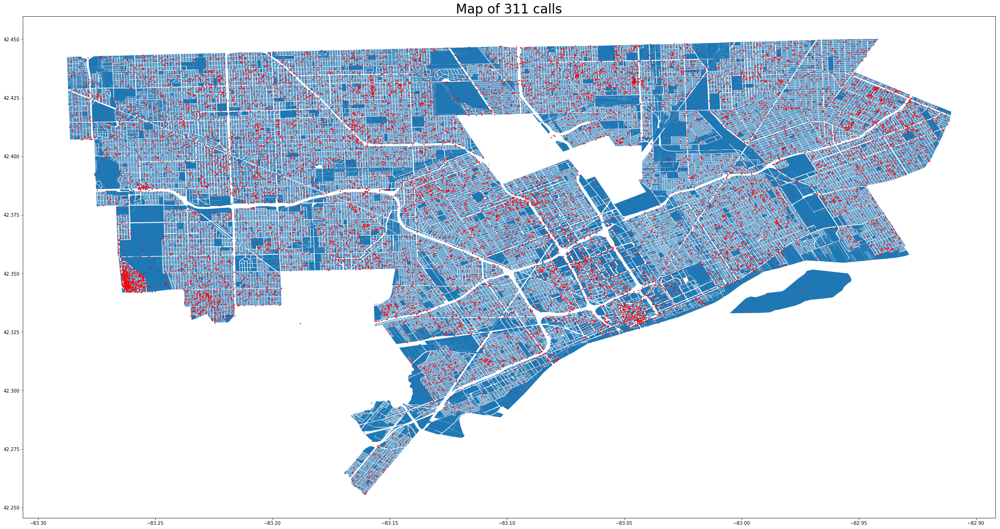

In [13]:
detroit_311_geo = detroit_311_geo[(detroit_311_geo.lng > -83.3) & \
                                  (detroit_311_geo.lng < -82.9) & \
                                  (detroit_311_geo.lat > 42.25) & \
                                  (detroit_311_geo.lat < 42.46)]
fig, ax = plt.subplots(1, figsize=(30, 20))
parcels.plot(ax=ax)
detroit_311_geo.plot(marker='o', markersize=2, color='r', ax=ax)
plt.title('Map of 311 calls', fontsize=28)
plt.tight_layout()
plt.show()

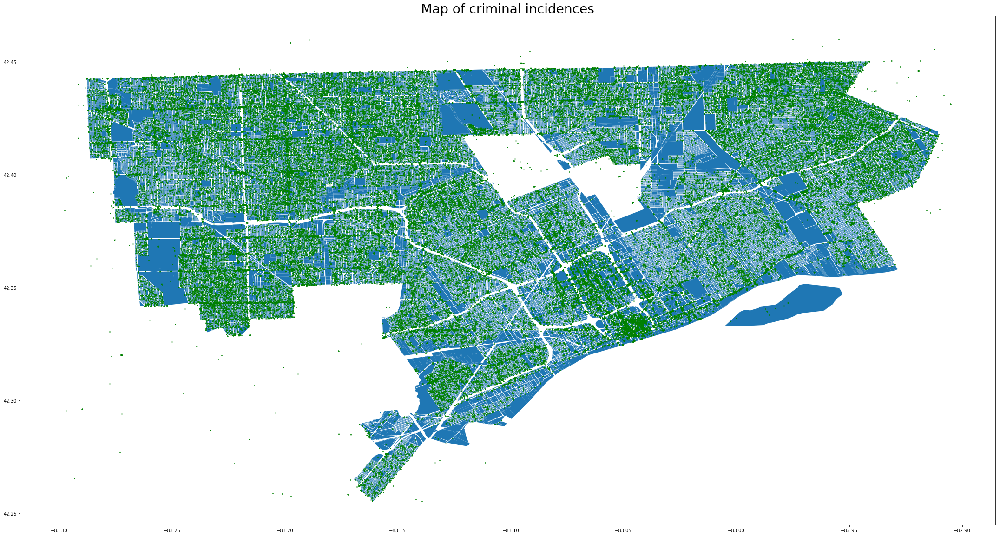

In [14]:
detroit_crime_geo = detroit_crime_geo[(detroit_crime_geo.geometry.y < 42.46) & \
                                      (detroit_crime_geo.geometry.y > 42.25) & \
                                      (detroit_crime_geo.geometry.x > -83.3) & \
                                      (detroit_crime_geo.geometry.x < -82.9)]
fig, ax = plt.subplots(1, figsize=(30, 20))
parcels.plot(ax=ax)
detroit_crime_geo.plot(marker='o', markersize=2, color='g', ax=ax)
plt.title('Map of criminal incidences', fontsize=28)
plt.tight_layout()
plt.show()


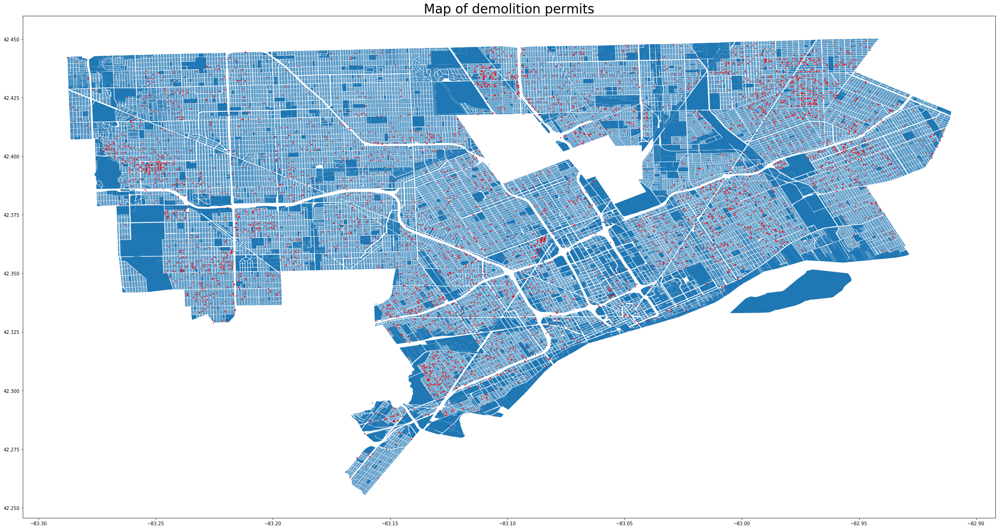

In [15]:
detroit_demolition_geo = detroit_demolition_geo[(detroit_demolition_geo.geometry.y < 42.46) & \
                                                (detroit_demolition_geo.geometry.y > 42.25) & \
                                                (detroit_demolition_geo.geometry.x > -83.3) & \
                                                (detroit_demolition_geo.geometry.x < -82.9)]
fig, ax = plt.subplots(1, figsize=(30, 20))
parcels.plot(ax=ax)
detroit_demolition_geo.plot(marker='o', markersize=2, color='r', ax=ax)
plt.title('Map of demolition permits', fontsize=28)
plt.tight_layout()
plt.show()

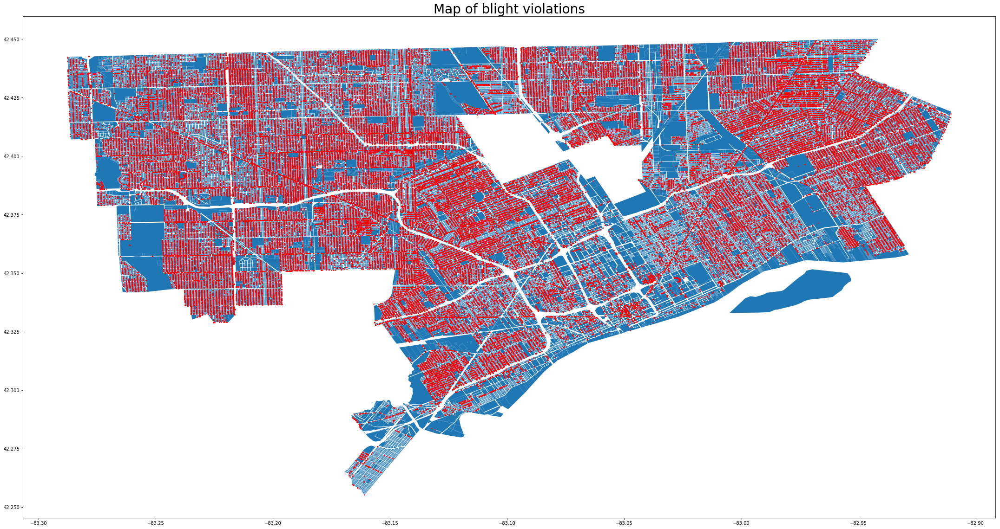

In [16]:
fig, ax = plt.subplots(1, figsize=(30, 20))
parcels.plot(ax=ax)
blight_violation_geo.plot(marker='o', markersize=2, color='r', ax=ax)
plt.title('Map of blight violations', fontsize=28)
plt.tight_layout()
plt.show()

In [67]:
parcels['geometry'] = parcels.geometry.to_crs(epsg=6499)
blight_violation_geo['geometry'] = blight_violation_geo.geometry.to_crs(epsg=6499)
detroit_311_geo['geometry'] = detroit_311_geo.geometry.to_crs(epsg=6499)
detroit_crime_geo['geometry'] = detroit_crime_geo.geometry.to_crs(epsg=6499)
detroit_demolition_geo['geometry'] = detroit_demolition_geo.geometry.to_crs(epsg=6499)
parcels.geometry.head()

RuntimeError: b'latitude or longitude exceeded limits'

In [ ]:
parcels.plot();

In [19]:
blight_violation_geo['geometry'] = blight_violation_geo['geometry'].buffer(1000)
blight_violation_geo['geometry'].head()

TicketID
26288    POLYGON ((13468918.73565995 317177.4835592955,...
19800    POLYGON ((13433807.48708119 340802.6048514226,...
19804    POLYGON ((13431879.54042033 340527.4052687117,...
20208    POLYGON ((13454089.36053401 345573.3702823819,...
20211    POLYGON ((13454118.72794184 337781.4924812009,...
Name: geometry, dtype: object

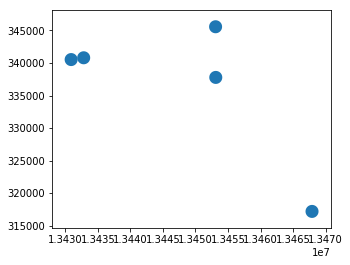

In [20]:
blight_violation_geo.iloc[0:5].plot()

In [21]:
from scipy.spatial import cKDTree

def ckdnearest(gdA, gdB, index_column='index'):
    '''Find nearest points in two datasets gdA and gdB. Values from "colunn" used for "parcel_index" '''
    nA = np.array(list(zip(gdA.geometry.x, gdA.geometry.y)) )
    nB = np.array(list(zip(gdB.geometry.x, gdB.geometry.y)) )
    btree = cKDTree(nB)
    dist, idx = btree.query(nA, k=1)
    gdf = pd.DataFrame({'parcel_index': gdB.reset_index().iloc[idx][index_column], 'distance': dist, 
                        'label': ['blighted']*len(idx), 'incident_index': gdA.index}).reset_index()
    return gdf

def add_noBlighted(blighted_indexes, parcels, demolition):
    ''' Find parcels without demolition parmition (negative samples)
        and calculate distance to the closest parcel with demolition permition'''
    parcels = parcels.sample(frac=1.0)
    selected = parcels.drop(blighted_indexes, axis=0)
    print(parcels.shape, selected.shape)
    selected = selected.iloc[:blighted_indexes.shape[0]].index
    df_dist = ckdnearest(parcels.iloc[selected], demolition, index_column = 'PARCEL_NO')
    gdf = pd.DataFrame({'parcel_index': selected, 'distance': df_dist['distance'], 
                        'label': ['not_blighted']*len(selected), 'incident_index': np.nan})
    return gdf
    

In [22]:
# Define centroids of parcels for calculation of distances to the points in other datasets
parcels['centroid'] = parcels['geometry'].centroid

# Create copy of parcel with dot-geometry instead poligon-geometry
parcels_centroid = parcels.copy()
parcels_centroid['geometry'] = parcels_centroid['centroid']
parcels_centroid = parcels_centroid.drop('centroid', axis=1)

# Find parcels most close to the coordinates in demolition permits 
#as they are the most probable objects received the permits
demolition_parcels = ckdnearest(detroit_demolition_geo, parcels_centroid[['geometry', 'address']])
demolition_parcels.head()

,index,parcel_index,distance,label,incident_index
0,297006,297006,85.725879,blighted,BLD2015-03955
1,78923,78923,69.961674,blighted,BLD2015-04083
2,70557,70557,82.184895,blighted,BLD2015-03976
3,190097,190097,98.121746,blighted,BLD2015-03781
4,195820,195820,82.385217,blighted,BLD2015-03677


min     12.043805
max    362.455205
Name: distance, dtype: float64


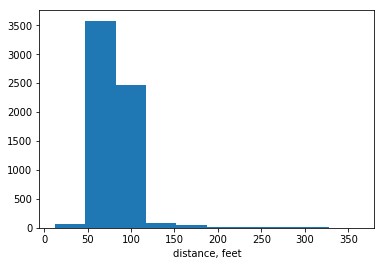

In [23]:
print(demolition_parcels.distance.agg(['min', 'max']))
#demolition_parcels['distance'].plot(kind='bar')
plt.hist(demolition_parcels['distance'])
plt.xlabel('distance, feet');

Some parcels are very distant from coordinates of demolition permits. May be something wrong.

In [24]:
print('Total number of demolition permits - {0}\nNumber of unique parcels with demolition permits - {1}'.\
      format(demolition_parcels.shape[0], demolition_parcels['parcel_index'].nunique()))

#demolition_parcels = demolition_parcels[demolition_parcels.distance <= 150]

Total number of demolition permits - 6315
Number of unique parcels with demolition permits - 4817


Unique parcels in the created list much less then expected.

In [25]:
ags = demolition_parcels.groupby('parcel_index').agg('count')
ags.sort_values(by='distance', ascending=False).head()

,index,distance,label,incident_index
parcel_index,,,,
372392,548,548,548,548
65763,45,45,45,45
182403,20,20,20,20
217561,19,19,19,19
244356,16,16,16,16


Some parcels have large number of demolition permits. Let's on the parcel No 372392

In [26]:
per_no = demolition_parcels[demolition_parcels['parcel_index'] == 372392]['incident_index']
detroit_demolition_geo.loc[per_no] #.head(10)

,PERMIT_APPLIED,PERMIT_ISSUED,PERMIT_EXPIRES,SITE_ADDRESS,BETWEEN1,PARCEL_NO,LOT_NUMBER,SUBDIVISION,CASE_TYPE,CASE_DESCRIPTION,...,CONTRACTOR_ADDRESS2,CONTRACTOR_CITY,CONTRACTOR_STATE,CONTRACTOR_ZIP,CONDITION_FOR_APPROVAL,site_location,owner_location,contractor_location,geom,geometry
PERMIT_NO,,,,,,,,,,,,,,,,,,,,,
BLD2015-01206,2015-03-31,2015-03-31,12/5/16,3901- 11 BEAUBIEN,Between MACK and NO CROSS STREET,1 3850-67,7&8,MORE THAN ONE SUBDIVISION,BLD,Building Permit,...,NaN,DETROIT,MI,48203.0,NaN,"(42.3316811380001, -83.047996037)","(42.350067682, -83.056972362)","(42.432300438, -83.099987832)","(42.3316811380001, -83.047996037)",POINT (13479902.04741225 305881.1063681098)
BLD2015-01206,2015-03-31,2015-03-31,12/5/16,3901- 11 BEAUBIEN,Between MACK and NO CROSS STREET,1 3850-67,7&8,MORE THAN ONE SUBDIVISION,BLD,Building Permit,...,NaN,DETROIT,MI,48203.0,NaN,"(42.3316811380001, -83.047996037)","(42.350067682, -83.056972362)","(42.432300438, -83.099987832)","(42.3316811380001, -83.047996037)",POINT (13479902.04741225 305881.1063681098)
BLD2015-01206,2015-03-31,2015-03-31,12/5/16,3901- 11 BEAUBIEN,Between MACK and NO CROSS STREET,1 3850-67,7&8,MORE THAN ONE SUBDIVISION,BLD,Building Permit,...,NaN,DETROIT,MI,48203.0,NaN,"(42.3316811380001, -83.047996037)","(42.350067682, -83.056972362)","(42.432300438, -83.099987832)","(42.3316811380001, -83.047996037)",POINT (13479902.04741225 305881.1063681098)
BLD2015-01206,2015-03-31,2015-03-31,12/5/16,3901- 11 BEAUBIEN,Between MACK and NO CROSS STREET,1 3850-67,7&8,MORE THAN ONE SUBDIVISION,BLD,Building Permit,...,NaN,DETROIT,MI,48203.0,NaN,"(42.3316811380001, -83.047996037)","(42.350067682, -83.056972362)","(42.432300438, -83.099987832)","(42.3316811380001, -83.047996037)",POINT (13479902.04741225 305881.1063681098)
BLD2015-00920,2015-03-11,2015-03-11,9/11/15,7349- 7355 E JEFFERSON,Between FIELD and SHERIDAN,17 26.,21,M. W. FIELDS SUB,BLD,Building Permit,...,NaN,DETROIT,MI,48203.0,NaN,"7349 7355 E\nDETROIT, MI\n(42.331681138000079,...","6194 N TIMBERWOOD\nWEST BLOOMFIELD, MI 48322\n...","20000 JOHN\nDETROIT, MI 48203\n(42.41999949900...",NaN,POINT (13479902.04741226 305881.1063681005)
BLD2015-00678,2015-02-23,2015-02-23,8/23/15,2504 EDSEL,Between OMAHA and DOWNING,20 14739.,208,HARRAHS FORT ST (PLATS),BLD,Building Permit,...,STE 1100,DETROIT,MI,NaN,NaN,"2504 EDSEL\nDETROIT, MI\n(42.331681138000079, ...","65 CADILLAC SQ\nDETROIT, MI 48226\n(42.3317371...","2389 E OUTER DR\nDETROIT, MI\n(42.440536784000...",NaN,POINT (13479902.04741226 305881.1063681005)
BLD2015-00412,2015-02-23,2015-02-23,8/23/15,8026- 30 E FOREST,Between MAXWELL and VAN DYKE,17 572.,13,POTTERS SUB OF LOTS 20 &,BLD,Building Permit,...,STE 1100,DETROIT,MI,NaN,NaN,"8026 30 E FOREST\nDETROIT, MI\n(42.33168113800...","65 CADILLAC SQ\nDETROIT, MI 48226\n(42.3317371...","2389 E OUTER DR\nDETROIT, MI\n(42.440536784000...",NaN,POINT (13479902.04741226 305881.1063681005)
BLD2015-00222,2015-02-03,2015-02-03,8/3/15,3272- 74 CLAIRMOUNT,Between ST MARTINS and PEMBROKE,22 56251.,514,LONGVIEW (PLATS),BLD,Building Permit,...,11TH FLOOR,SHELBY TWP,MI,NaN,NaN,"3272 74\nDETROIT, MI\n(42.331681138000079, -83...","65 CADILLAC SQUARE\nDETROIT, MI 48226\n(42.331...","5675 AUBURN RD\nSHELBY TWP, MI\n(42.6342918190...",NaN,POINT (13479902.04741226 305881.1063681005)
BLD2014-05945,2014-12-19,2014-12-19,6/19/15,488 WARING,Between SANDERS and DUMFRIES,20 15416.,145,IRVINE & WISES ADDITION (,BLD,Building Permit,...,NaN,DETROIT,MI,NaN,NaN,"488 WARING\nDETROIT, MI\n(42.331681138000079, ...","539 S MAIN\nFINDLAY, OH 45840\n(41.03627974300...","2001 WATERMAN\nDETROIT, MI\n(42.31392982000005...",NaN,POINT (13479902.04741226 305881.1063681005)


All of the selected demolition permits have the same coordinates. Some of them have the same address. But most of them have different addresses. If we will try to find the places on Google Maps by the coordinates than we see that the address is different.

I didn't want use addresses for joining datasets, as them could have mistakes, shortening, and styles. However, GPS-coordinates is less reliable information here.

Dataset of demolition permitions has column 'PARCEL_NO', but it is not the same as in parcels dataset. Investigations of parcels number in both datasets allow me to prepare function for transformation:

In [27]:
def parcel_num_transformator(num):
    '''Transform parcel number from stile in demolition permit
       to the style in parcels dataset'''
    num = num.split(' ')
    if len(num) < 2:
        return '0'
    if len(num) == 3:
        num[0] = '0'+num[0]
        del num[1]
    if len(num[0]) < 2:
        num[0] = '0'+num[0]
    
    second_part = num[1].split('-')
    if len(second_part) > 1:
        appendix = '-'+second_part[1]
    else:
        appendix = ''
        
    second_part = second_part[0].split('.')
    second_part[0] = ('0' * (6 - len(second_part[0]))) + second_part[0]
    if len(second_part) == 2:
        second_part[0] += '.'+second_part[1]
    
    return num[0] + second_part[0] + appendix

In [28]:
detroit_demolition_geo['parcel'] = detroit_demolition_geo['PARCEL_NO'].apply(parcel_num_transformator)
#detroit_demolition_geo.head()

Now, lets try merge parcels dataset with demolition permition dataset and remove remaining doubles.

In [29]:
in_parcels = ['parcelnum', 'address', 'bldg_style', 'depth', 'flr_area', 'frontage', 
              'hmstd_pre', 'imp_value', 'land_value', 'landmap', 'num_bldgs',
              'prop_class', 'sale_date', 'sale_price', 'tax_status', 
              'total_acre', 'ward', 'yr_built', 'zoning', 'geometry']
demolition_parcels = pd.merge(left=parcels[in_parcels], right=detroit_demolition_geo['parcel'], 
                              left_on='parcelnum', right_on='parcel', suffixes=('_p', '_d'))
ags = demolition_parcels.groupby('parcelnum').agg('count')
ags.sort_values(by='address', ascending=False)['address'].head()

parcelnum
03000611-9      13
22081472-3      11
13000172-420     7
16038216.        6
14001186.        6
Name: address, dtype: int64

In [30]:
b = demolition_parcels.shape[0]
demolition_parcels = demolition_parcels.drop_duplicates(subset='parcelnum')
print('Number of duplicates = {0}'.format(b - demolition_parcels.shape[0]))
demolition_parcels['blighted'] = [1] * demolition_parcels.shape[0]
demolition_parcels = demolition_parcels.drop(['parcel'], axis=1)

Number of duplicates = 818


In [31]:
# Findind equal number of parcels without demolition permition
parcels_to_add = parcels[-parcels['parcelnum'].isin(demolition_parcels['parcelnum'])].sample(frac=1.0)
parcels_to_add = parcels_to_add.iloc[:demolition_parcels.shape[0]][in_parcels]
parcels_to_add['blighted']  = [0] * parcels_to_add.shape[0]
parcels_to_add.shape

(5357, 20)

In [32]:
# Put positive and negative samplestogethere
demolition_parcels = pd.concat([demolition_parcels, parcels_to_add], axis=0).sample(frac=1.0)
demolition_parcels.shape

(10714, 20)

In [33]:
demolition_parcels.head()

,parcelnum,address,depth,flr_area,frontage,hmstd_pre,imp_value,land_value,landmap,num_bldgs,prop_class,sale_date,sale_price,tax_status,total_acre,ward,yr_built,zoning,geometry,blighted
137769,09020482.,19171 HANNA,93.0,908.0,30.0,100.0,13198.0,261.0,376,1.0,401,None,0.0,TAXABLE,0.064,09,1924.0,R1,"POLYGON ((13467930.24857359 342905.9167707202,...",0
149102,22069121.,6759 RUTLAND,127.0,1492.0,35.0,0.0,27833.0,686.0,266,1.0,465,1993-12-01 00:00:00,41000.0,TAXABLE,0.102,22,1931.0,R1,"POLYGON ((13435320.37846323 308533.1669147064,...",0
5942,22077628-9,8672 PENROD,137.0,0.0,40.0,0.0,0.0,817.0,270,0.0,461,2009-02-20 00:00:00,78682.0,CITY LAND BANK,0.125,22,0.0,R1,"POLYGON ((13433282.08623733 314449.6535762073,...",1
159290,13019850.,18019 SUNSET,107.0,0.0,30.0,0.0,0.0,325.0,425,0.0,402,None,0.0,RELIGIOUS,0.074,13,0.0,B4,"POLYGON ((13475833.99027695 340295.9734722885,...",0
4576,20003150.,8815 FALCON,100.0,0.0,30.0,0.0,0.0,597.0,136,0.0,402,1974-01-01 00:00:00,16500.0,TAXABLE,0.069,20,0.0,R2,"POLYGON ((13457564.31601995 295241.1098143205,...",0


Now, lets join parcels dataset with information about incidents

In [34]:
# Criminal incidents inside boundaries of the selected parcels


In [35]:
crime_parcels = ckdnearest(detroit_crime_geo, parcels_centroid[['geometry', 'address']])

In [36]:
crime_parcels.head()

,index,parcel_index,distance,label,incident_index
0,189035,189035,67.840462,blighted,1953933
1,205301,205301,82.947778,blighted,1917717
2,207304,207304,100.754730,blighted,1910955
3,4415,4415,31.384100,blighted,2018186
4,369480,369480,52.514408,blighted,1986862


In [37]:
# Check places with high number of incidents
ags = crime_parcels.groupby('parcel_index').agg('count')
ags.sort_values(by='label', ascending=False)['label'][:10]

parcel_index
300072    234
229929    221
327756    184
200357    175
15699     168
107889    156
56776     146
331167    129
33180     108
246909    107
Name: label, dtype: int64

In [38]:
# Filtering out pleces with number of incidents > 50 (They are police station, hospitals, large shopping centers etc.)
crime_filt = crime_parcels[crime_parcels['parcel_index'].isin(ags[ags['label'] > 50].index)]['incident_index']
detroit_crime_geo = detroit_crime_geo.drop(crime_filt, axis=0)

In [39]:
# Find crime incidents in the area of parcels, 100, 250, 500, and 1000 feet around the parcels
detroit_crime_area = detroit_crime_geo[['CATEGORY', 'geometry']].copy()
crime_inplace = gpd.sjoin(demolition_parcels[['parcelnum', 'geometry']], detroit_crime_area)
crime_inplace = crime_inplace.drop('index_right', axis=1)
crime_inplace.shape

(1865, 3)

In [40]:
detroit_crime_area.geometry = detroit_crime_area.geometry.buffer(100)
crime_100feet = gpd.sjoin(demolition_parcels[['parcelnum', 'geometry']], detroit_crime_area)
crime_100feet = crime_100feet.drop('index_right', axis=1)
crime_100feet.shape

(23230, 3)

In [41]:
detroit_crime_area.geometry = detroit_crime_area.geometry.buffer(150)
crime_250feet = gpd.sjoin(demolition_parcels[['parcelnum', 'geometry']], detroit_crime_area)
crime_250feet = crime_250feet.drop('index_right', axis=1)
crime_250feet.shape

(97774, 3)

In [42]:
detroit_crime_area.geometry = detroit_crime_area.geometry.buffer(250)
crime_500feet = gpd.sjoin(demolition_parcels[['parcelnum', 'geometry']], detroit_crime_area)
crime_500feet = crime_500feet.drop('index_right', axis=1)
crime_500feet.shape

(332716, 3)

In [43]:
detroit_crime_area.geometry = detroit_crime_area.geometry.buffer(500)
crime_1000feet = gpd.sjoin(demolition_parcels[['parcelnum', 'geometry']], detroit_crime_area)
crime_1000feet = crime_1000feet.drop('index_right', axis=1)
crime_1000feet.shape

(1190586, 3)

In [44]:
crime_1000feet.CATEGORY.value_counts()
#crime_1000feet.CATEGORY.unique()
# Selected categories includes traffic, assault or robbery, property, burglary, drug, homicide
def tot_crime_quant(category):
    '''For creating additional column with 1 if incident, 0 - else'''
    return 1 if isinstance(category, str) else 0

def crime_category_quant(category, cat_type):
    '''For creating additional column with 1 if incident description include cat_type, 0 - else'''
    return 1 if cat_type.lower() in category.lower() else 0

def crime_category_classification(df):
    crime_categories = ['traffic', 'assault', 'robbery', 
                        'property', 'burglary', 'drug',' homicide']
    df['incident'] = df.CATEGORY.apply(tot_crime_quant)
    for category in crime_categories:
        df[category] = df.CATEGORY.apply(lambda x: crime_category_quant(x, category))
    df['assault'] = df['assault'] + df['robbery']
    df = df.drop('robbery', axis = 1)
    return df

crime_inplace = crime_category_classification(crime_inplace)
crime_inplace = crime_inplace.groupby('parcelnum').agg(sum)

In [45]:
crime_100feet = crime_category_classification(crime_100feet)
crime_100feet = crime_100feet.groupby('parcelnum').agg(sum)

In [46]:
crime_250feet = crime_category_classification(crime_250feet)
crime_250feet = crime_250feet.groupby('parcelnum').agg(sum)

In [47]:
crime_500feet = crime_category_classification(crime_500feet)
crime_500feet = crime_500feet.groupby('parcelnum').agg(sum)

In [48]:
crime_1000feet = crime_category_classification(crime_1000feet)
crime_1000feet = crime_1000feet.groupby('parcelnum').agg(sum)

In [49]:
parcels_crime_agg = demolition_parcels.join(crime_inplace, on='parcelnum', how='left', rsuffix='_in')
parcels_crime_agg = parcels_crime_agg.join(crime_100feet, on='parcelnum', how='left', rsuffix='_100f')
parcels_crime_agg = parcels_crime_agg.join(crime_250feet, on='parcelnum', how='left', rsuffix='_250f')
parcels_crime_agg = parcels_crime_agg.join(crime_500feet, on='parcelnum', how='left', rsuffix='_500f')
parcels_crime_agg = parcels_crime_agg.join(crime_1000feet, on='parcelnum', how='left', rsuffix='_1000f')
parcels_crime_agg = parcels_crime_agg.fillna(0.0)

In [50]:
parcels_crime_agg.head()

,parcelnum,address,depth,flr_area,frontage,hmstd_pre,imp_value,land_value,landmap,num_bldgs,...,burglary_500f,drug_500f,homicide_500f,incident_1000f,traffic_1000f,assault_1000f,property_1000f,burglary_1000f,drug_1000f,homicide_1000f
137769,09020482.,19171 HANNA,93.0,908.0,30.0,100.0,13198.0,261.0,376,1.0,...,2.0,6.0,0.0,178,74,43,13,5,6,0
149102,22069121.,6759 RUTLAND,127.0,1492.0,35.0,0.0,27833.0,686.0,266,1.0,...,5.0,3.0,0.0,180,54,44,11,14,8,0
5942,22077628-9,8672 PENROD,137.0,0.0,40.0,0.0,0.0,817.0,270,0.0,...,3.0,2.0,0.0,251,79,72,13,12,5,0
159290,13019850.,18019 SUNSET,107.0,0.0,30.0,0.0,0.0,325.0,425,0.0,...,0.0,0.0,0.0,72,34,14,2,4,2,0
4576,20003150.,8815 FALCON,100.0,0.0,30.0,0.0,0.0,597.0,136,0.0,...,4.0,2.0,0.0,198,56,51,20,17,6,0


In [51]:
parcels_crime_agg.shape

(10714, 55)

In [52]:
blight_violation_area = blight_violation_geo[['ViolationCategory', 'geometry']].copy()
blight_inplace = gpd.sjoin(demolition_parcels[['parcelnum', 'geometry']], blight_violation_area)
blight_inplace = blight_inplace.drop('index_right', axis=1)
blight_inplace['blight_incident'] = 1
blight_inplace['blight_1cat'] = blight_inplace['ViolationCategory'].apply(lambda x: 1 if x == 1 else np.nan)
blight_inplace['blight_0cat'] = blight_inplace['ViolationCategory'].apply(lambda x: 1 if x == 0 else np.nan)

blight_violation_area.geometry = blight_violation_area.geometry.buffer(250)
blight_violation_250feet = gpd.sjoin(demolition_parcels[['parcelnum', 'geometry']], blight_violation_area)
blight_violation_250feet = blight_violation_250feet.drop('index_right', axis=1)
blight_violation_250feet['blight_incident_in250feet'] = 1
blight_violation_250feet['blight_1cat_in250feet'] = blight_violation_250feet['ViolationCategory'].apply(lambda x: 1 if x == 1 else np.nan)
blight_violation_250feet['blight_0cat_in250feet'] = blight_violation_250feet['ViolationCategory'].apply(lambda x: 1 if x == 0 else np.nan)
blight_violation_250feet.head()

,parcelnum,geometry,ViolationCategory,blight_incident_in250feet,blight_1cat_in250feet,blight_0cat_in250feet
137769,09020482.,"POLYGON ((13467930.24857359 342905.9167707202,...",0,1,NaN,1.0
5074,09021298.,"POLYGON ((13467354.42521306 344505.6103402172,...",0,1,NaN,1.0
251002,09021857.,"POLYGON ((13466985.70585272 343879.2351716212,...",0,1,NaN,1.0
80851,09020270.,"POLYGON ((13468018.35583768 344362.2744040668,...",0,1,NaN,1.0
2408,09021314.,"POLYGON ((13467402.1134051 343116.3395549075, ...",0,1,NaN,1.0


In [53]:
blight_violation_250feet.shape

(5390553, 6)

In [54]:
blight_inplace = blight_inplace.groupby('parcelnum').agg(sum)
blight_violation_250feet =blight_violation_250feet.groupby('parcelnum').agg(sum)

In [55]:
parcels_crime_agg = parcels_crime_agg.join(blight_inplace, on='parcelnum', how='left', rsuffix='_blight')
parcels_crime_agg = parcels_crime_agg.join(blight_violation_250feet, on='parcelnum', how='left', rsuffix='_blight250feet')

In [56]:
parcels_crime_agg.head()

,parcelnum,address,depth,flr_area,frontage,hmstd_pre,imp_value,land_value,landmap,num_bldgs,...,drug_1000f,homicide_1000f,ViolationCategory,blight_incident,blight_1cat,blight_0cat,ViolationCategory_blight250feet,blight_incident_in250feet,blight_1cat_in250feet,blight_0cat_in250feet
137769,09020482.,19171 HANNA,93.0,908.0,30.0,100.0,13198.0,261.0,376,1.0,...,6,0,0.0,281.0,0.0,281.0,0.0,454.0,0.0,454.0
149102,22069121.,6759 RUTLAND,127.0,1492.0,35.0,0.0,27833.0,686.0,266,1.0,...,8,0,0.0,534.0,0.0,534.0,0.0,715.0,0.0,715.0
5942,22077628-9,8672 PENROD,137.0,0.0,40.0,0.0,0.0,817.0,270,0.0,...,5,0,8.0,585.0,8.0,577.0,12.0,837.0,12.0,825.0
159290,13019850.,18019 SUNSET,107.0,0.0,30.0,0.0,0.0,325.0,425,0.0,...,2,0,0.0,284.0,0.0,284.0,0.0,408.0,0.0,408.0
4576,20003150.,8815 FALCON,100.0,0.0,30.0,0.0,0.0,597.0,136,0.0,...,6,0,0.0,478.0,0.0,478.0,0.0,661.0,0.0,661.0


In [57]:
d311_area = detroit_311_geo[['issue_type', 'geometry']].copy()
d311_inplace = gpd.sjoin(demolition_parcels[['parcelnum', 'geometry']], d311_area)
d311_inplace = d311_inplace.drop('index_right', axis=1)
d311_inplace['311_incident'] = 1
d311_inplace['311_dumping'] = d311_inplace['issue_type'].apply(lambda x: 1 if ('dump' in x.lower() or \
                                                                                'trash' in x.lower() or \
                                                                                'waste' in x.lower() or \
                                                                                'debris' in x.lower()) else 0)
d311_inplace['311_water'] = d311_inplace['issue_type'].apply(lambda x: 1 if ('water' in x.lower() or \
                                                                             'drain' in x.lower() or \
                                                                             'manhole' in x.lower()) else 0)
d311_inplace['311_pothol'] = d311_inplace['issue_type'].apply(lambda x: 1 if 'pothol' in x.lower() else 0)

In [58]:
d311_area.geometry = d311_area.geometry.buffer(250)
d311_250feet = gpd.sjoin(demolition_parcels[['parcelnum', 'geometry']], d311_area)
d311_250feet = d311_250feet.drop('index_right', axis=1)
d311_250feet['311_250feet'] = 1
d311_250feet['311_dumping_250feet'] = d311_250feet['issue_type'].apply(lambda x: 1 if ('dump' in x.lower() or \
                                                                                'trash' in x.lower() or \
                                                                                'waste' in x.lower() or \
                                                                                'debris' in x.lower()) else 0)
d311_250feet['311_water_250feet'] = d311_250feet['issue_type'].apply(lambda x: 1 if ('water' in x.lower() or \
                                                                             'drain' in x.lower() or \
                                                                             'manhole' in x.lower()) else 0)
d311_250feet['311_pothol_250feet'] = d311_250feet['issue_type'].apply(lambda x: 1 if 'pothol' in x.lower() else 0)


In [59]:
d311_inplace = d311_inplace.groupby('parcelnum').agg(sum)
d311_250feet = d311_250feet.groupby('parcelnum').agg(sum)
parcels_crime_agg = parcels_crime_agg.join(d311_inplace, on='parcelnum', how='left', rsuffix='_d311')
parcels_crime_agg = parcels_crime_agg.join(d311_250feet, on='parcelnum', how='left', rsuffix='_d311')

In [60]:
parcels_crime_agg = parcels_crime_agg.fillna(0.0)
parcels_crime_agg.head()

,parcelnum,address,depth,flr_area,frontage,hmstd_pre,imp_value,land_value,landmap,num_bldgs,...,blight_1cat_in250feet,blight_0cat_in250feet,311_incident,311_dumping,311_water,311_pothol,311_250feet,311_dumping_250feet,311_water_250feet,311_pothol_250feet
137769,09020482.,19171 HANNA,93.0,908.0,30.0,100.0,13198.0,261.0,376,1.0,...,0.0,454.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
149102,22069121.,6759 RUTLAND,127.0,1492.0,35.0,0.0,27833.0,686.0,266,1.0,...,0.0,715.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
5942,22077628-9,8672 PENROD,137.0,0.0,40.0,0.0,0.0,817.0,270,0.0,...,12.0,825.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
159290,13019850.,18019 SUNSET,107.0,0.0,30.0,0.0,0.0,325.0,425,0.0,...,0.0,408.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4576,20003150.,8815 FALCON,100.0,0.0,30.0,0.0,0.0,597.0,136,0.0,...,0.0,661.0,0.0,0.0,0.0,0.0,3.0,0.0,2.0,0.0


In [61]:
parcels_crime_agg.corrwith(parcels_crime_agg.blighted).sort_values()

yr_built                          -0.609885
hmstd_pre                         -0.364856
num_bldgs                         -0.311579
property_1000f                    -0.105436
burglary_1000f                    -0.097349
burglary_500f                     -0.084844
property_500f                     -0.082545
incident_1000f                    -0.062270
property_250f                     -0.060603
burglary_250f                     -0.059926
incident_500f                     -0.054174
burglary_100f                     -0.051793
property_100f                     -0.050353
assault_250f                      -0.048669
assault_100f                      -0.047972
assault_1000f                     -0.044342
assault_500f                      -0.044147
incident_250f                     -0.043096
311_incident                      -0.041272
incident_100f                     -0.041182
burglary                          -0.034001
311_250feet                       -0.033738
311_pothol_250feet              

In [62]:
#demolition_parcels = pd.concat([demolition_parcels, add_noBlighted(demolition_parcels['parcel_index'], 
                                parcels_centroid, detroit_demolition_geo)]).reset_index()
#demolition_parcels['geometry'] = parcels.loc[demolition_parcels['parcel_index'], 'geometry']
#demolition_parcels.head()

IndentationError: unexpected indent (<ipython-input-62-ecb48078ac7e>, line 2)

In [ ]:
colors = ['red', 'tan']
plt.figure(figsize=(16,6))
plt.hist([demolition_parcels[demolition_parcels['label'] == 'blighted']['distance'], 
          demolition_parcels[demolition_parcels['label'] == 'not_blighted']['distance']], 
           color=colors, label='colors', bins=100);

In [ ]:
def find_parcel(parcel_shape, coordinate):
    distance = np.inf
    ind = None
    for row in parcel_shape.itertuples():
        if row.geometry.intersects(coordinate):
            return (row.Index, 0.0)
        else :
            d = row.geometry.distance(coordinate)
            if d < distance:
                distance = d
                ind = row.Index
    return (ind, distance)

#for index, row in detroit_demolition_geo.iterrows():
#    c = row['geometry']
#    print(c)
#    print(find_parcel(parcels, c))
#parcels.head()

In [ ]:
def create_parcel_labels(parcels, demolition):
    indexes = []
    labels = []
    distances, geometries = [], []
    nr = 0
    for ind, row in detroit_demolition_geo.iterrows():
        index, distance = find_parcel(parcels, row['geometry'])
        indexes.append(index)
        distances.append(distance)
        labels.append('blighted')
        geometries.append(parcels.loc[index, 'geometry'])
        nr += 1
        if nr % 100 == 0:
            print(nr)
        #if nr > 5:
        #    break
    n_labeled = len(indexes)
    print(n_labeled)
    while len(indexes) <= n_labeled*2:
        row = parcels.sample(n=1)
        if row.index[0] not in indexes:
            indexes.append(row.index[0])
            labels.append('not_blighted')
            distances.append(np.inf)
            geometries.append(row.iloc[0]['geometry'])
            #print(row.iloc[0]['geometry'])
            nr += 1
            if nr % 100 == 0:
                print(nr)
    return pd.DataFrame({'building_id': indexes, 'label': labels, 'distance_to_demolition': distances, 'geometry': geometries})

#df_labeled = create_parcel_labels(parcels, detroit_demolition_geo)
#df_labeled.to_csv('labeled_parcels.csv', index=False)
#df_labeled.head(10)

In [ ]:
# slow function, I will not using it
№from shapely.ops import nearest_points

def nearest(row, geom_union, df1, df2, geom1_col='geometry', 
            geom2_col='geometry', src_column=None):
    """Find the nearest point and return the corresponding value from specified column."""
    # Find the geometry that is closest
    nearest = df2[geom2_col] == nearest_points(row[geom1_col], geom_union)[1]
    # Get the corresponding value from df2 (matching is based on the geometry)
    value = df2[nearest][src_column].get_values()[0]
    return value